# WMT of tendency terms
## CM2.6
## Table Of Contents: <a class="anchor" id="top"> </a>
* [Make histogram of each term](#first-bullet)
* [Save histograms](#second-bullet)

# 1) Make histogram of each term <a class='anchor' id='first-bullet'> </a>

In [1]:
!pip install git+https://github.com/mathause/regionmask.git

  Cloning https://github.com/mathause/regionmask.git to /tmp/pip-req-build-ed5k26cp
  Running command git clone --filter=blob:none --quiet https://github.com/mathause/regionmask.git /tmp/pip-req-build-ed5k26cp
  Resolved https://github.com/mathause/regionmask.git to commit 31b39e0ff6f2635ab4c92de800efb04c79a8ee24
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for regionmask: filename=regionmask-0.9.0.post1.dev27+g31b39e0-py3-none-any.whl size=65494 sha256=84e30627da244cab7632f4cc6759b5bcde3ed2fa59454d811544352e75fc2566
  Stored in directory: /tmp/pip-ephem-wheel-cache-loiua3d0/wheels/1a/62/0f/f392f37f9bd2d2d61b9a6b63de17bb421b3f7c2972b03c9934
Successfully built regionmask


In [2]:
!pip install git+https://github.com/jbusecke/xmip.git

  Cloning https://github.com/jbusecke/xmip.git to /tmp/pip-req-build-ahn_gucy
  Running command git clone --filter=blob:none --quiet https://github.com/jbusecke/xmip.git /tmp/pip-req-build-ahn_gucy
  Resolved https://github.com/jbusecke/xmip.git to commit 16ce8bbe4df5ea4150f7da516eeccc6fd06131a4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached xgcm-0.6.1-py3-none-any.whl (60 kB)
  Created wheel for xmip: filename=xmip-0.7.2.dev4+g16ce8bb-py3-none-any.whl size=58752 sha256=f2c54a5e45c6ae1d6731a81f239d0bf0a5958f16c3fba4b27f87a7c0d4fe29fa
  Stored in directory: /tmp/pip-ephem-wheel-cache-9n4bozlg/wheels/14/81/1d/2382ef5c4df3bc79c5b5a3c37400af047e5a775a4b2cf79b42
Successfully built xmip
  Attempting uninstall: xgcm
    Found existing installation: xgcm 0.8.1
    Uninstalling xgcm-0.8.1:
      Successfully uninstalled xgcm-0.8.1
  Attempting uninstall: xmip
    Found existing installation: x

In [2]:
from dask_gateway import Gateway
g = Gateway()
cluster = g.connect(g.list_clusters()[0].name)
client = cluster.get_client()

In [3]:
client

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.aca20d682b9f49d0ad60ba953a5bd910/status,


In [87]:
cluster.close()
client.close()

In [4]:
import xarray as xr
import numpy as np
import dask.array as dsa
import matplotlib.pyplot as plt
from fastjmd95 import jmd95numba
import gcsfs
import gcm_filters
import xgcm
from typing import Annotated
#import gsw

In [5]:
from intake import open_catalog

url = "https://raw.githubusercontent.com/pangeo-data/pangeo-datastore/master/intake-catalogs/ocean/GFDL_CM2.6.yaml"
cat = open_catalog(url)
ds  = cat["GFDL_CM2_6_control_ocean"].to_dask()
coord  = cat["GFDL_CM2_6_grid"].to_dask()

/srv/conda/envs/notebook/lib/python3.10/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


In [6]:
#Load in tendencies

import json
with open('/home/jovyan/pangeo-181919-f141378dc975.json') as token_file:
    token = json.load(token_file)
gcfs_w_token = gcsfs.GCSFileSystem(token=token)

In [7]:
tracers = xr.open_zarr(gcfs_w_token.get_mapper('pangeo-tmp/stb2145/CM2_6/datasets/tracer_tendencies_jmd95.zarr'))
drhodts = xr.open_zarr(gcfs_w_token.get_mapper('pangeo-tmp/stb2145/CM2_6/datasets/drhodts_tendencies_jmd95.zarr'))
rho_cab = xr.open_zarr(gcfs_w_token.get_mapper('pangeo-tmp/stb2145/CM2_6/datasets/rho_lap_cab_tendencies_jmd95.zarr'))

tendencies = xr.merge([tracers, drhodts, rho_cab])

In [8]:
tendencies

<xarray.Dataset>
Dimensions:    (time: 240, yt_ocean: 2700, xt_ocean: 3600)
Coordinates:
  * time       (time) object 0181-01-16 12:00:00 ... 0200-12-16 12:00:00
  * xt_ocean   (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean   (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
Data variables:
    SSS_lap    (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    SST_lap    (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    drhods     (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    drhodt     (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    cabbeling  (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    rho        (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    rho_lap    (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>

In [9]:
selection = dict(xt_ocean=slice(-75,-25), yt_ocean=slice(25,60))
kwargs = {'shrink': 0.8, 'label':r'[$\frac{kg}{m^3 s}$]'}

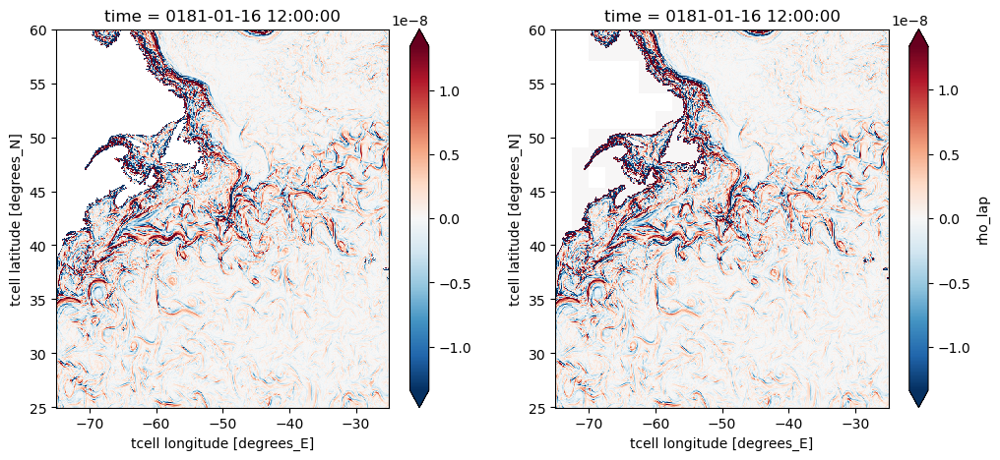

In [10]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(12,5))
((tendencies.SST_lap*tendencies.drhodt)+
 (tendencies.SSS_lap*tendencies.drhods)).isel(time=0).sel(**selection).plot(robust=True,ax=ax0)
(tendencies.rho_lap).isel(time=0).sel(**selection).plot(robust=True, ax=ax1)

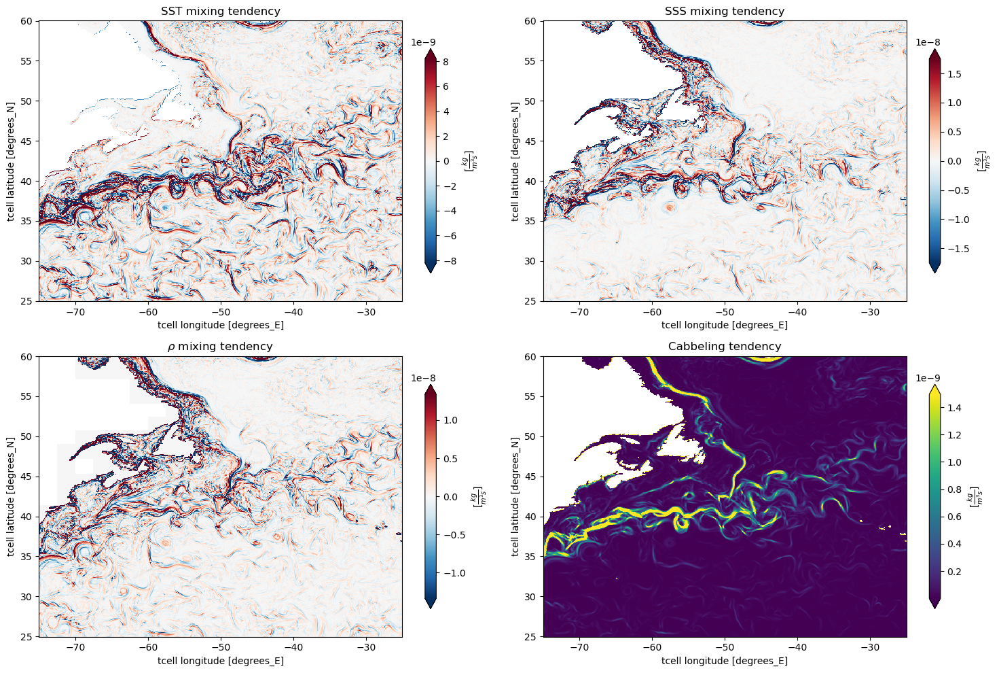

In [11]:
#plot all four terms
fig, ax = plt.subplots(2,2, figsize=(15,10))

(tendencies.SST_lap*tendencies.drhodt).isel(time=0).sel(**selection).plot(robust=True, ax=ax[0,0], 
                                 cbar_kwargs=kwargs)
ax[0,0].set_title('SST mixing tendency')
(tendencies.SSS_lap*tendencies.drhods).isel(time=0).sel(**selection).plot(robust=True, ax=ax[0,1], 
                                 cbar_kwargs=kwargs)
ax[0,1].set_title('SSS mixing tendency')
(tendencies.rho_lap).isel(time=0).sel(**selection).plot(robust=True, ax=ax[1,0], 
                                 cbar_kwargs=kwargs)
ax[1,0].set_title(r'$\rho$ mixing tendency')
(tendencies.cabbeling).isel(time=0).sel(**selection).plot(robust=True, ax=ax[1,1], 
                                   cbar_kwargs=kwargs)
ax[1,1].set_title('Cabbeling tendency')

plt.tight_layout();

# Create basin mask for CM2.6

In [10]:
import regionmask  
from xmip.preprocessing import combined_preprocessing
from xmip.regionmask import merged_mask

<GeoAxes: >

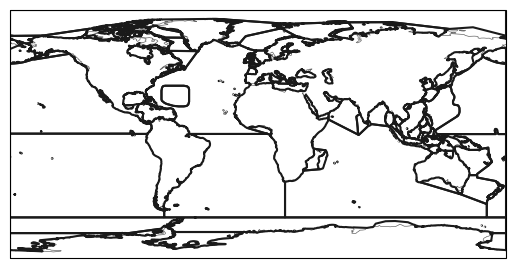

In [11]:
# load ocean basin data
basins = regionmask.defined_regions.natural_earth_v4_1_0.ocean_basins_50
basins.plot(add_ocean=False, add_label=False)

In [12]:
da = ds.temp.isel(time=0, st_ocean=0).squeeze()

In [13]:
da_renamed = da.rename({'geolat_t':'lat', 'geolon_t':'lon'}).load()

In [14]:
da_renamed

<xarray.DataArray 'temp' (yt_ocean: 2700, xt_ocean: 3600)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    lat       (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan nan
    lon       (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan nan
    st_ocean  float64 5.034
    time      object 0181-01-16 12:00:00
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
Attributes:
    cell_methods:   time: mean
    long_name:      Potential temperature
    standard_name:  sea_water_potential_temperature
    time_avg_info:  average_T1,average_T2,average_DT
    units:          degrees C
    valid_range:    [-10.0, 500.0]

In [15]:
mask = merged_mask(basins, da_renamed)

/srv/conda/envs/notebook/lib/python3.10/site-packages/regionmask/core/mask.py:151: FutureWarning: Passing 'lon_name' and 'lat_name' is deprecated. Please pass the lon and lat coordinates direcly, e.g., `mask*(ds[lon_name], ds[lat_name])`.
  warnings.warn(
/srv/conda/envs/notebook/lib/python3.10/site-packages/pygeos/io.py:523: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  arr[:] = geometry


In [18]:
mask

<xarray.DataArray 'mask' (yt_ocean: 2700, xt_ocean: 3600)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    lat       (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan nan
    lon       (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan nan
    st_ocean  float64 5.034
    time      object 0181-01-16 12:00:00
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98

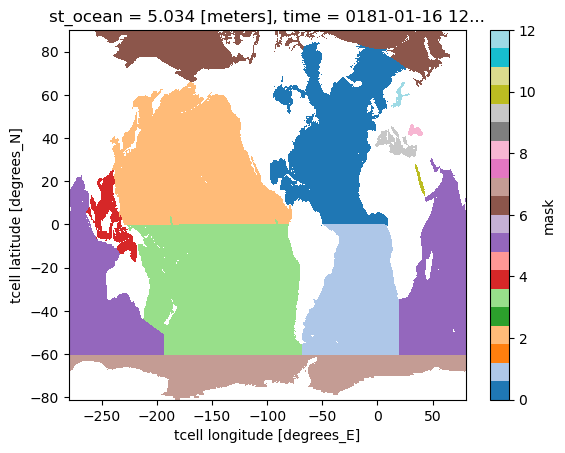

In [16]:
mask.plot(cmap='tab20');

In [17]:
#assign each region index value to basin name

north_atlantic_ocean = 0
south_atlantic_ocean = 1
north_pacific_ocean = 2
south_pacific_ocean = 3
south_china_seas = 4
indian_ocean = 5
arctic_ocean = 6
southern_ocean = 7
black_sea = 8
med_sea = 9
red_sea = 10
baltic_sea = 12 #no 11

# Split the tendencies by basin

In [18]:
#New ds after dthetadt*drhodt and dSdt*drhods
def new_ds(ds):
    newds = xr.merge([(ds['SST_lap']*ds['drhodt']).rename('sst'),
                      (ds['SSS_lap']*ds['drhods']).rename('sss'),
                       ds['rho_lap'].rename('rho_lap'),
                       ds['cabbeling']])
    return newds

In [19]:
tend = new_ds(tendencies)

In [20]:
tend

<xarray.Dataset>
Dimensions:    (time: 240, xt_ocean: 3600, yt_ocean: 2700)
Coordinates:
  * time       (time) object 0181-01-16 12:00:00 ... 0200-12-16 12:00:00
  * xt_ocean   (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean   (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
Data variables:
    sst        (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    sss        (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    rho_lap    (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    cabbeling  (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>

In [21]:
def basin_selection(tend_term, basin):
    tendency_in_basin = tend_term.where(mask==basin)
    return tendency_in_basin

In [22]:
all_tendencies = list(tend)

In [23]:
#Atlantic Ocean - going to add 'NATL' prefix after adding natl_ocean+nor_sea+lab_sea respective vars
natl_ocean = xr.merge([basin_selection(tend[var],
                                       north_atlantic_ocean).rename('NATL_' + var) for var in all_tendencies])
satl_ocean = xr.merge([basin_selection(tend[var], 
                                       south_atlantic_ocean).rename('SATL_' + var) for var in all_tendencies])

#Pacific Ocean
npac_ocean = xr.merge([basin_selection(tend[var], 
                                       north_pacific_ocean).rename('NPAC_' + var) for var in all_tendencies])
spac_ocean = xr.merge([basin_selection(tend[var], 
                                       south_pacific_ocean).rename('SPAC_' + var) for var in all_tendencies])

#Indian Ocean
ind_ocean = xr.merge([basin_selection(tend[var], indian_ocean).rename('IND_' + var) for var in all_tendencies])

#Arctic Ocean
arc_ocean = xr.merge([basin_selection(tend[var], arctic_ocean).rename('ARC_' + var) for var in all_tendencies])

#Southern Ocean
south_ocean = xr.merge([basin_selection(tend[var], 
                                        southern_ocean).rename('South_' + var) for var in all_tendencies])

In [20]:
natl_ocean

<xarray.Dataset>
Dimensions:         (time: 240, xt_ocean: 3600, yt_ocean: 2700)
Coordinates:
  * time            (time) object 0181-01-16 12:00:00 ... 0200-12-16 12:00:00
  * xt_ocean        (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.85 79.95
  * yt_ocean        (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.94 89.98
    lat             (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan
    lon             (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan
    st_ocean        float64 5.034
Data variables:
    NATL_sst        (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    NATL_sss        (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    NATL_rho_lap    (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    NATL_cabbeling  (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>

# Plot tendencies by basin

## North Atlantic

In [38]:
selection = dict(time=0, yt_ocean=slice(1500,1700), xt_ocean=slice(2000,2250))
kwargs = {'shrink': 0.8, 'label':r'[$\frac{kg}{m^3 s}$]'}

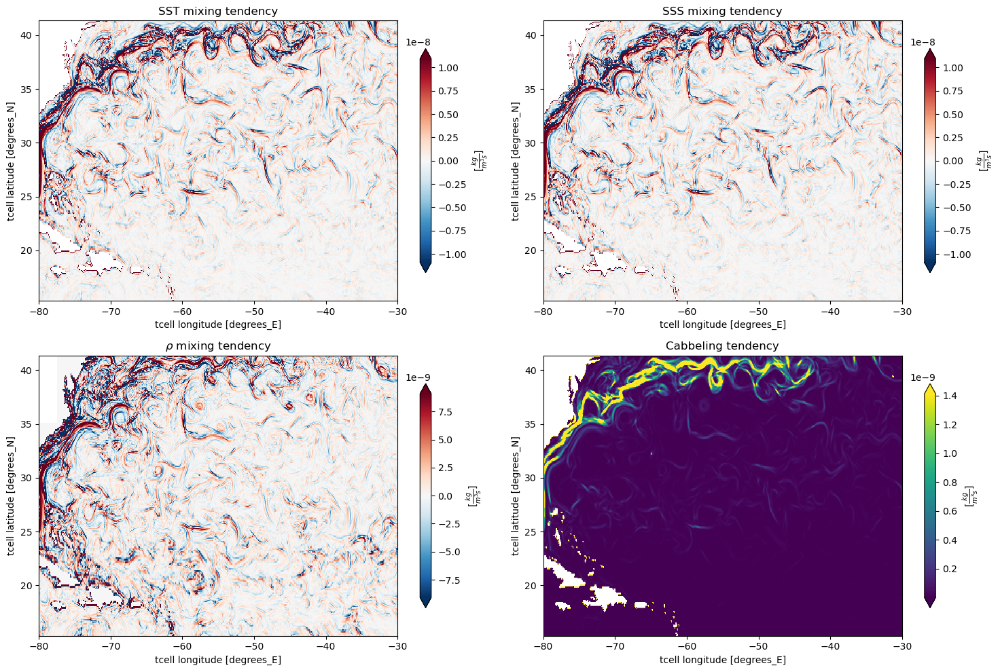

In [30]:
#plot all four terms
fig, ax = plt.subplots(2,2, figsize=(15,10))

(tend.sst).isel(**selection).plot(robust=True, ax=ax[0,0], 
                                 cbar_kwargs=kwargs)
ax[0,0].set_title('SST mixing tendency')
(tend.sst).isel(**selection).plot(robust=True, ax=ax[0,1], 
                                 cbar_kwargs=kwargs)
ax[0,1].set_title('SSS mixing tendency')
(tend.rho_lap).isel(**selection).plot(robust=True, ax=ax[1,0], 
                                 cbar_kwargs=kwargs)
ax[1,0].set_title(r'$\rho$ mixing tendency')
(tend.cabbeling).isel(**selection).plot(robust=True, ax=ax[1,1], 
                                   cbar_kwargs=kwargs)
ax[1,1].set_title('Cabbeling tendency')

plt.tight_layout();

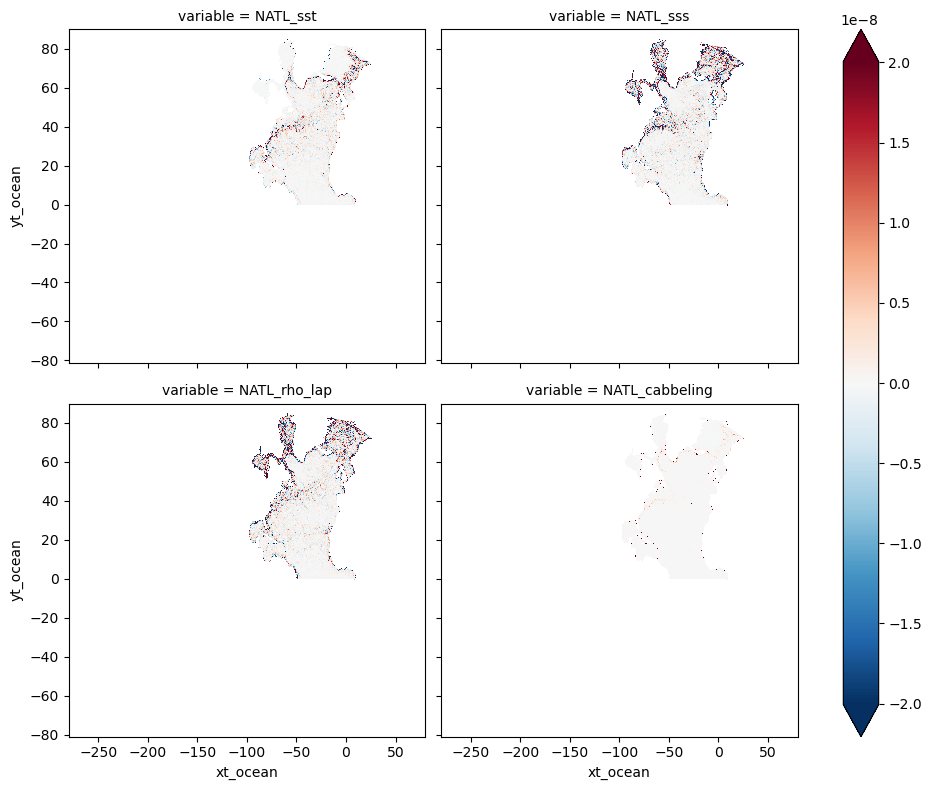

In [31]:
natl_ocean.isel(time=0).to_array().plot(col='variable', col_wrap=2, 
                                        robust=True, figsize=(10, 8))

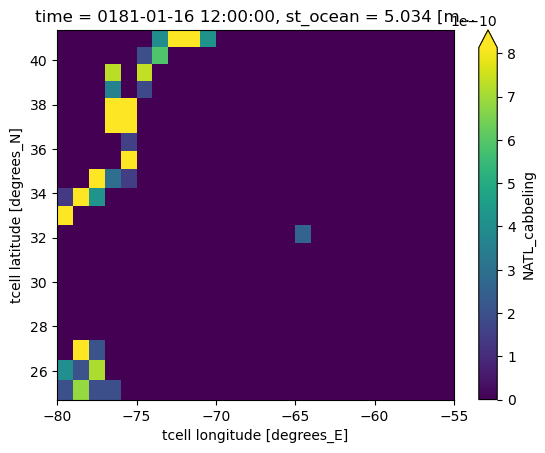

In [45]:
(natl_ocean.NATL_cabbeling**2).isel(**selection).fillna(0.).coarsen(xt_ocean=10, yt_ocean=10).mean().plot(robust=True)

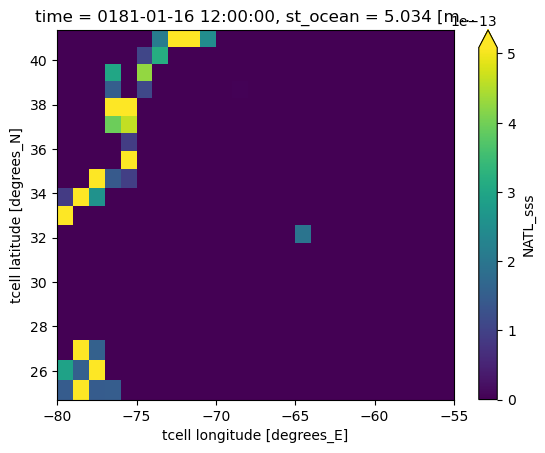

In [44]:
(natl_ocean.NATL_sss**2).isel(**selection).fillna(0.).coarsen(xt_ocean=10, yt_ocean=10).mean().plot(robust=True)

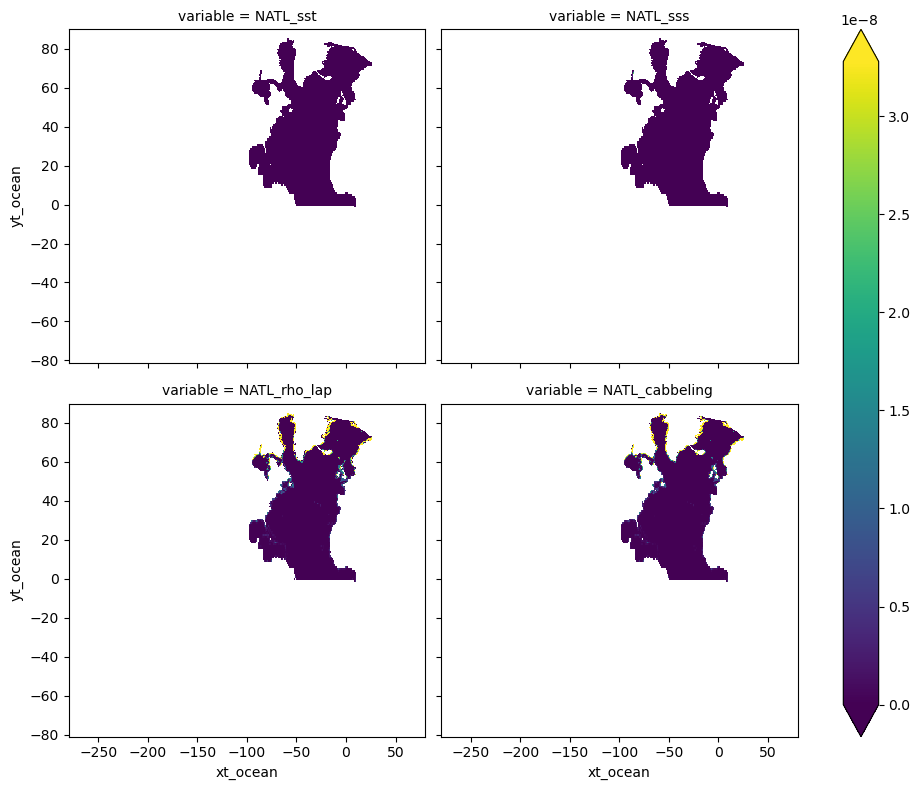

In [33]:
((natl_ocean.isel(time=0))**2).coarsen(xt_ocean=10, yt_ocean=10).mean().to_array().plot(col='variable', 
                                                                         col_wrap=2, robust=True, 
                                                                         figsize=(10, 8))

## South Atlantic

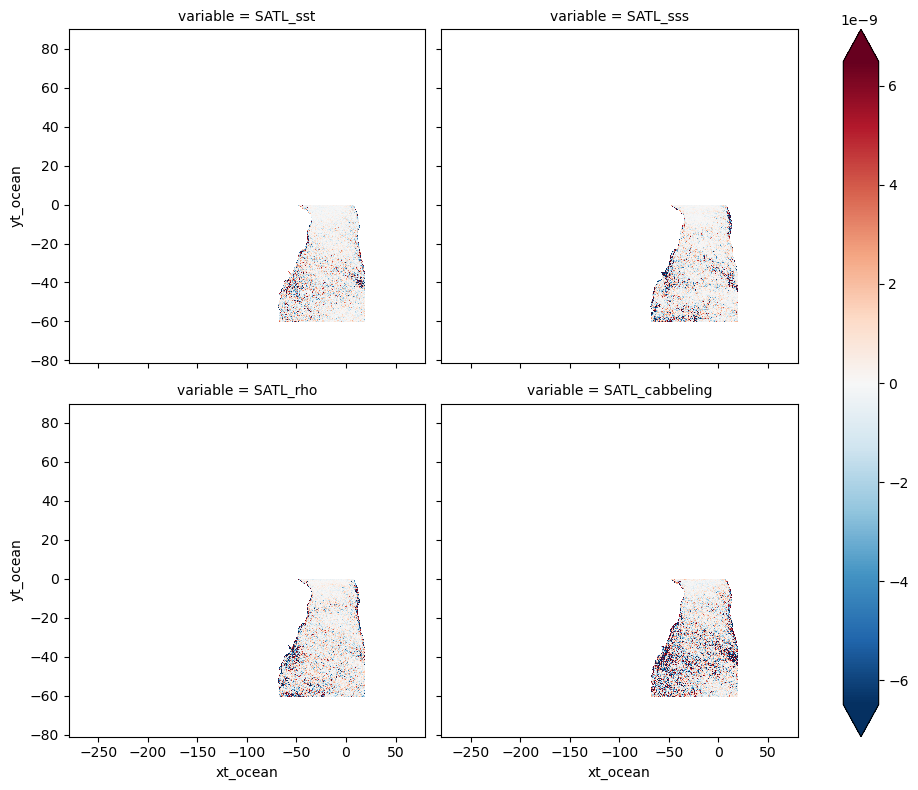

In [57]:
satl_ocean.isel(time=0).to_array().plot(col='variable', col_wrap=2, 
                                        robust=True, figsize=(10, 8))

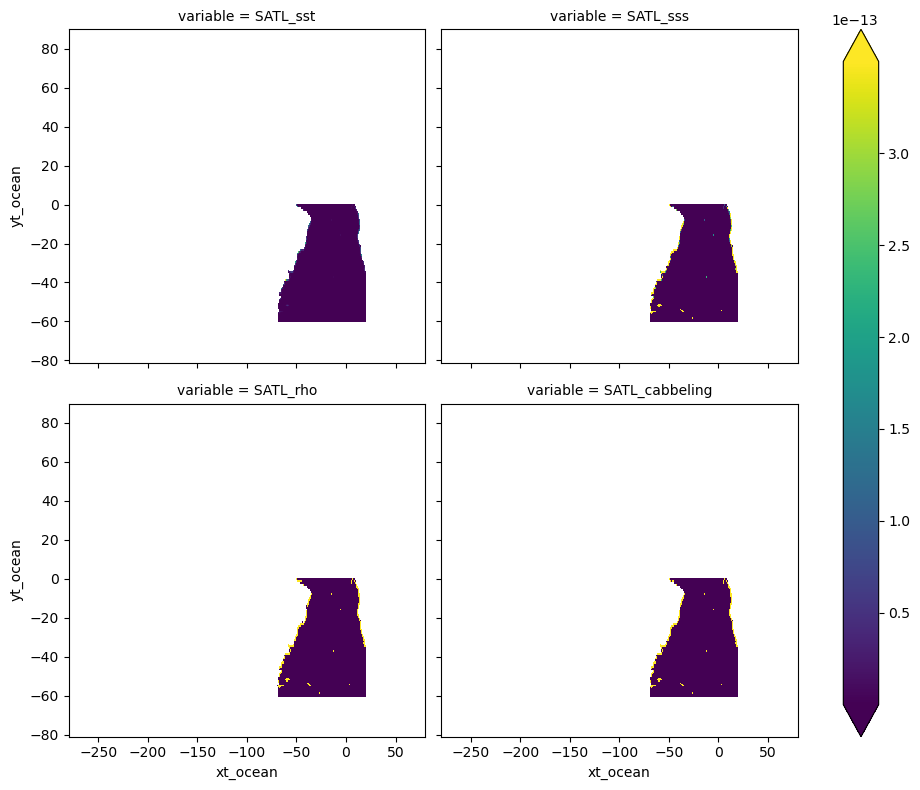

In [58]:
(satl_ocean.isel(time=0)**2).coarsen(xt_ocean=10, yt_ocean=10).mean().to_array().plot(col='variable', 
                                                                         col_wrap=2, robust=True, 
                                                                         figsize=(10, 8));

## North Pacific

In [26]:
client.restart()

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.a266e164b4e74578b1b04190968241d1/status,


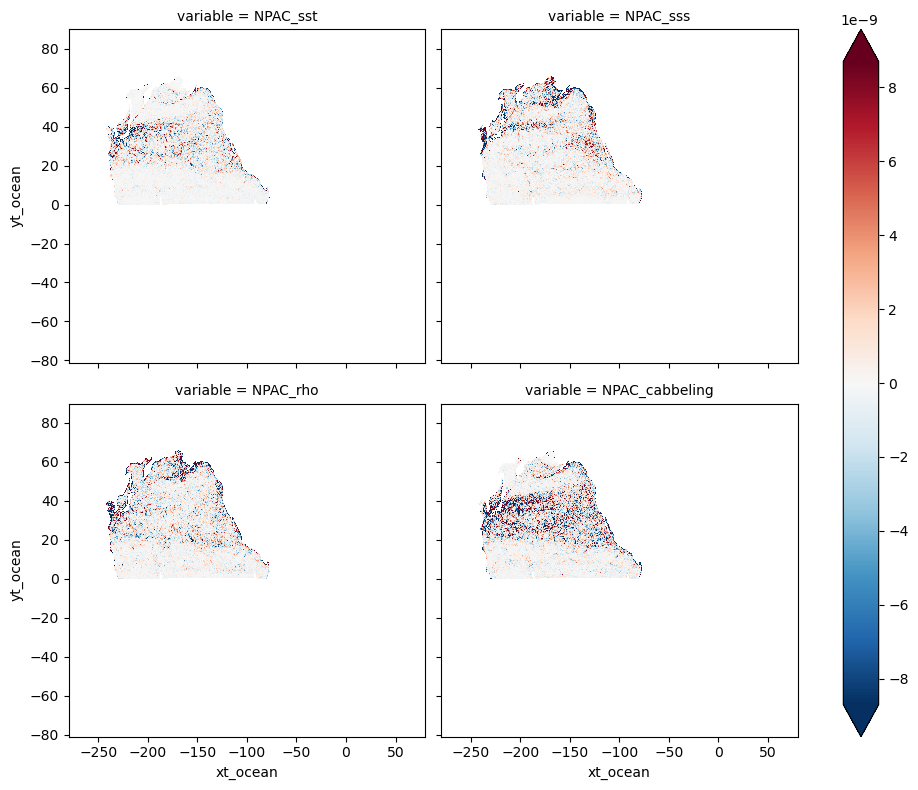

In [27]:
npac_ocean.isel(time=0).to_array().plot(col='variable', col_wrap=2, 
                                        robust=True, figsize=(10, 8))

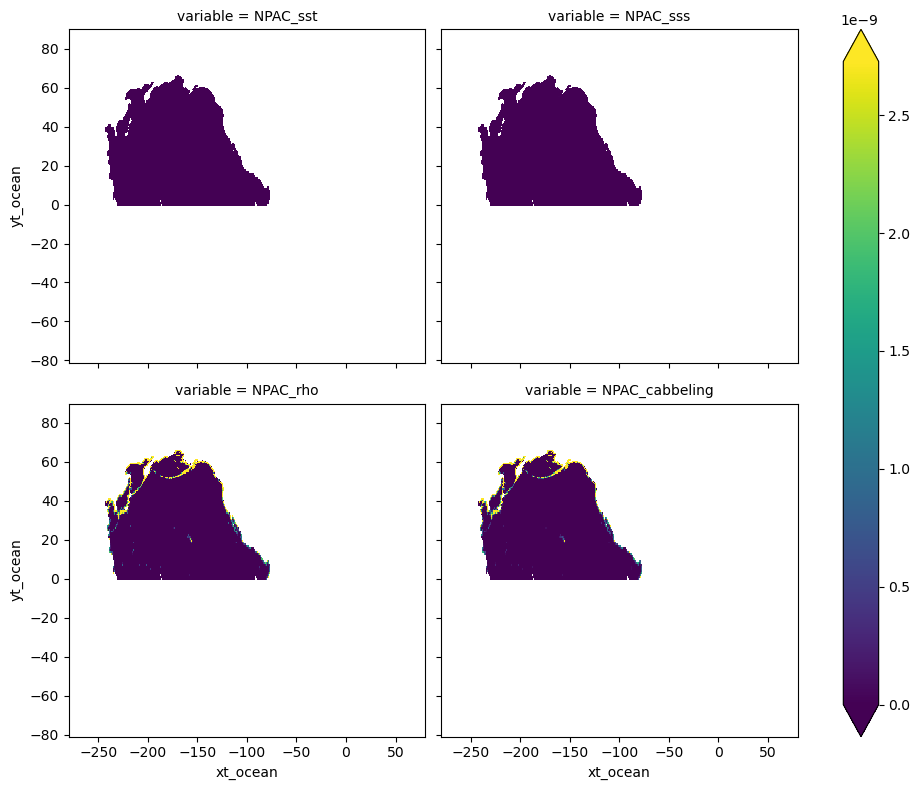

In [28]:
(npac_ocean.isel(time=0)**2).coarsen(xt_ocean=10, yt_ocean=10).mean().to_array().plot(col='variable', 
                                                                         col_wrap=2, robust=True, 
                                                                         figsize=(10, 8))

## South Pacific

In [29]:
client.restart()

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.a266e164b4e74578b1b04190968241d1/status,


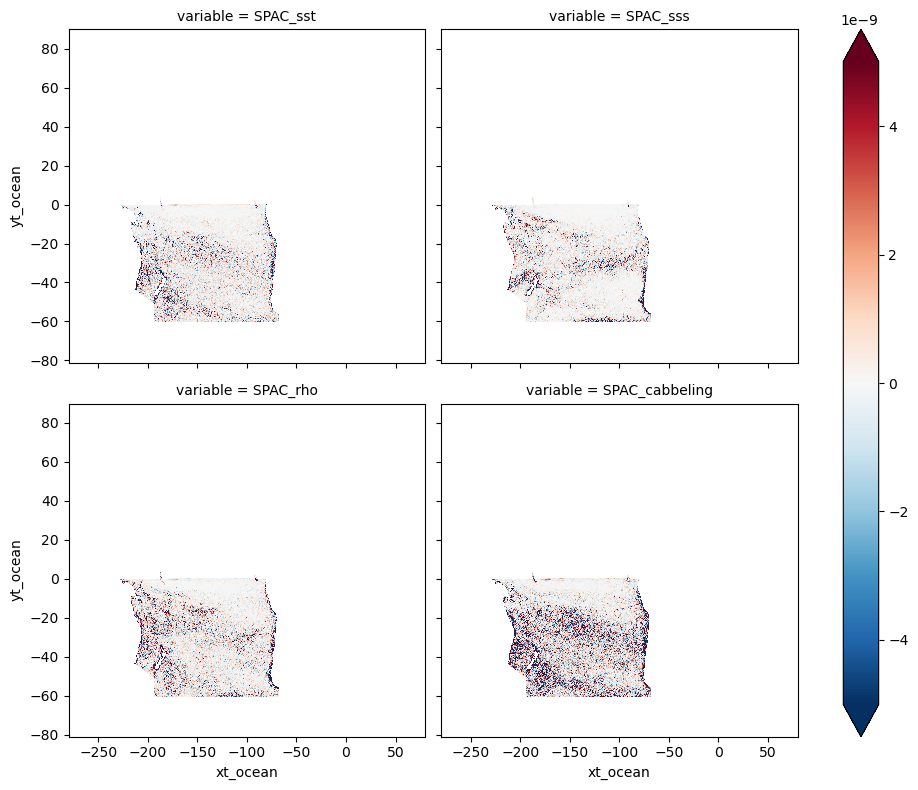

In [30]:
spac_ocean.isel(time=0).to_array().plot(col='variable', col_wrap=2, 
                                        robust=True, figsize=(10, 8))

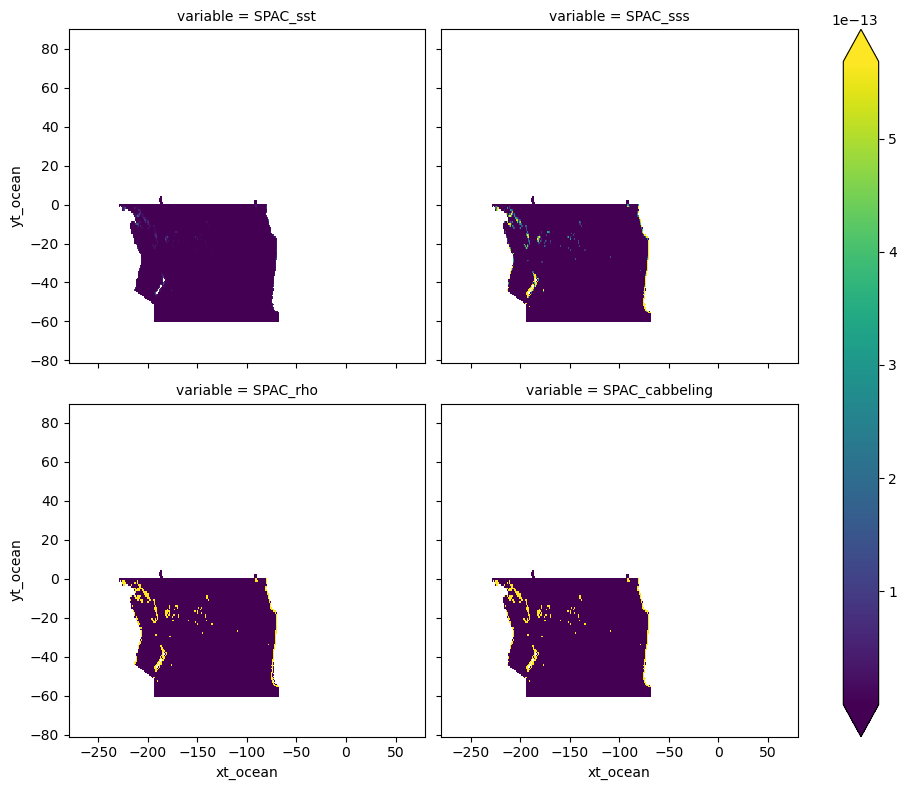

In [31]:
(spac_ocean.isel(time=0)**2).coarsen(xt_ocean=10, yt_ocean=10).mean().to_array().plot(col='variable', 
                                                                         col_wrap=2, robust=True, 
                                                                         figsize=(10, 8))

## Indian

In [19]:
client.restart()

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.a266e164b4e74578b1b04190968241d1/status,


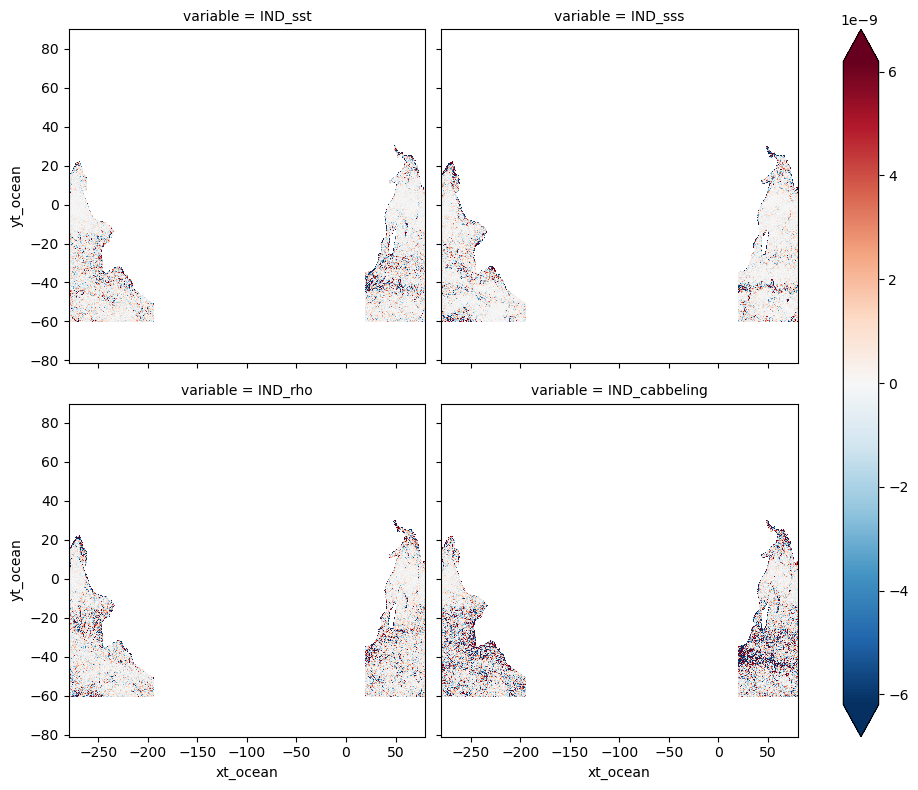

In [30]:
ind_ocean.isel(time=0).to_array().plot(col='variable', col_wrap=2, 
                                        robust=True, figsize=(10, 8))

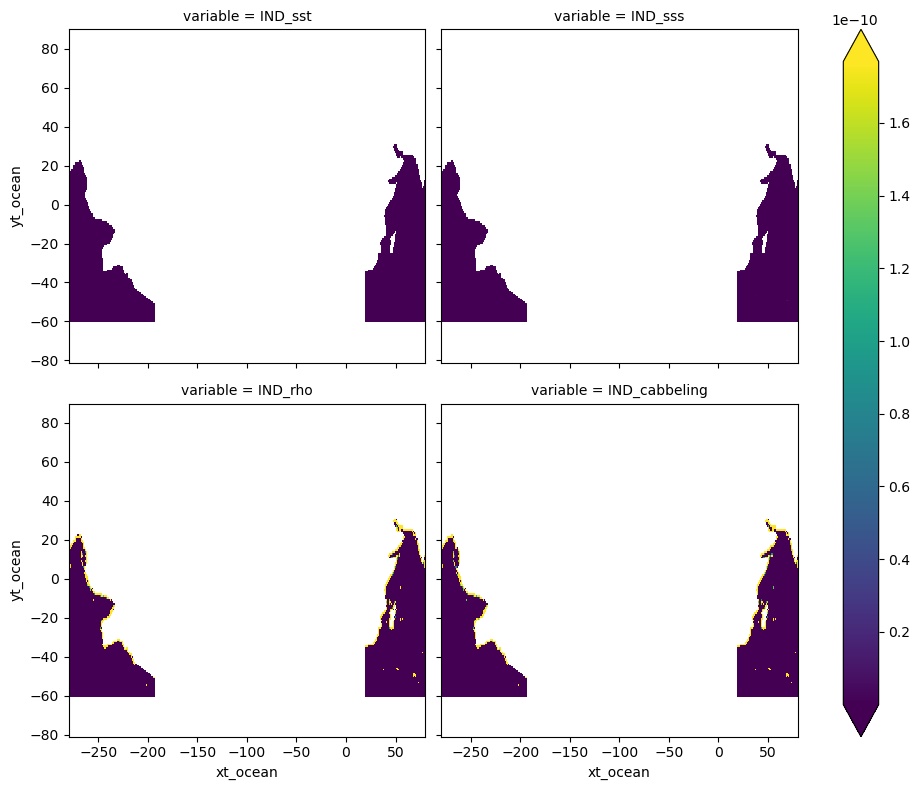

In [31]:
(ind_ocean.isel(time=0)**2).coarsen(xt_ocean=10, yt_ocean=10).mean().to_array().plot(col='variable', 
                                                                         col_wrap=2, robust=True, 
                                                                         figsize=(10, 8))

## Arctic

In [32]:
client.restart()

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.a266e164b4e74578b1b04190968241d1/status,


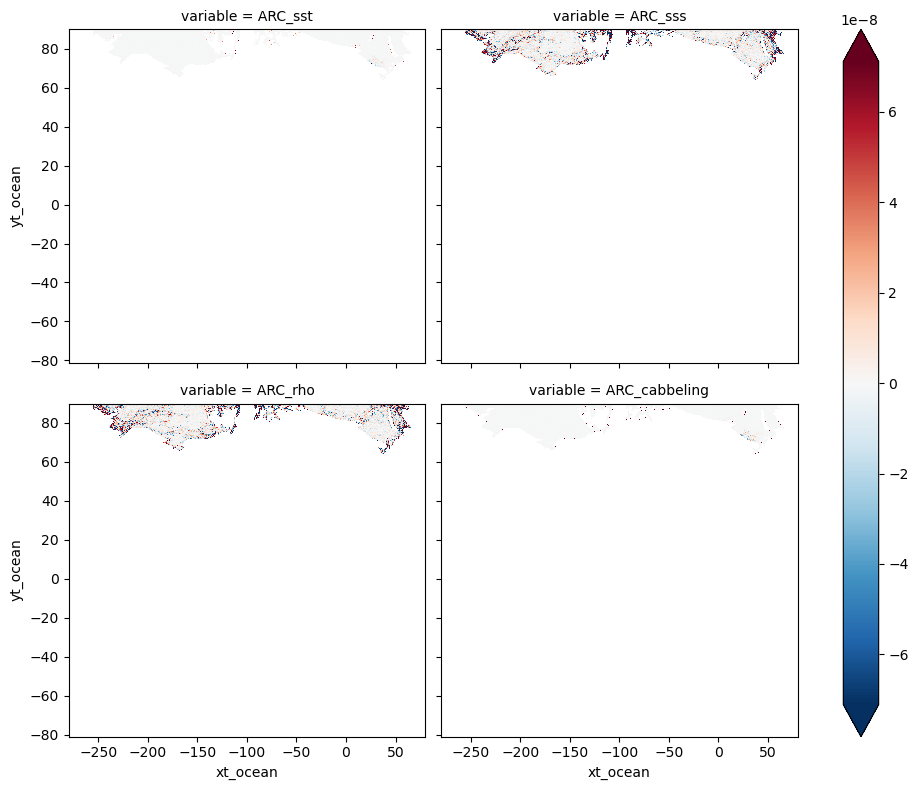

In [33]:
arc_ocean.isel(time=0).to_array().plot(col='variable', col_wrap=2, 
                                        robust=True, figsize=(10, 8));

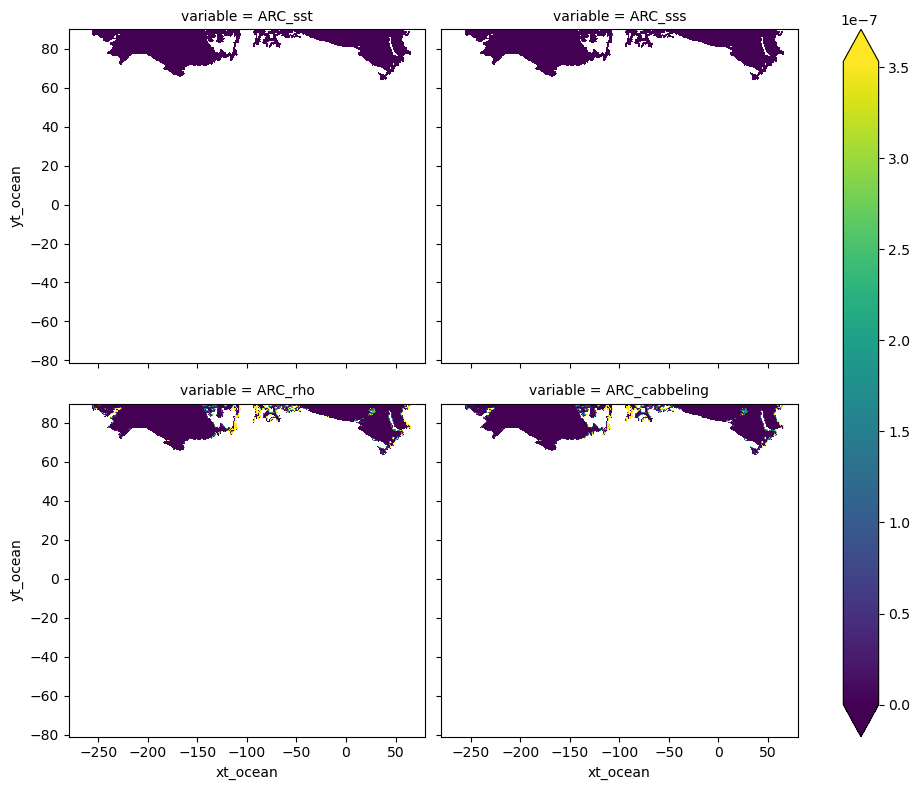

In [34]:
(arc_ocean.isel(time=0)**2).coarsen(xt_ocean=10, yt_ocean=10).mean().to_array().plot(col='variable', 
                                                                         col_wrap=2, robust=True, 
                                                                         figsize=(10, 8));

## Southern

In [35]:
client.restart()

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.a266e164b4e74578b1b04190968241d1/status,


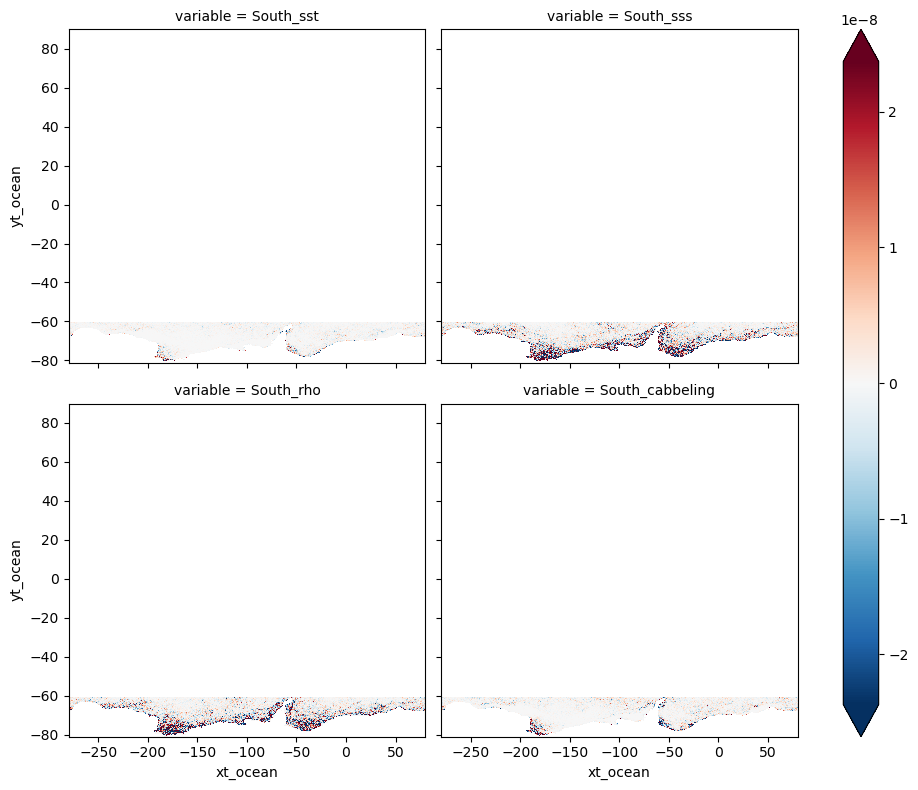

In [23]:
south_ocean.isel(time=0).to_array().plot(col='variable', col_wrap=2, 
                                        robust=True, figsize=(10, 8));

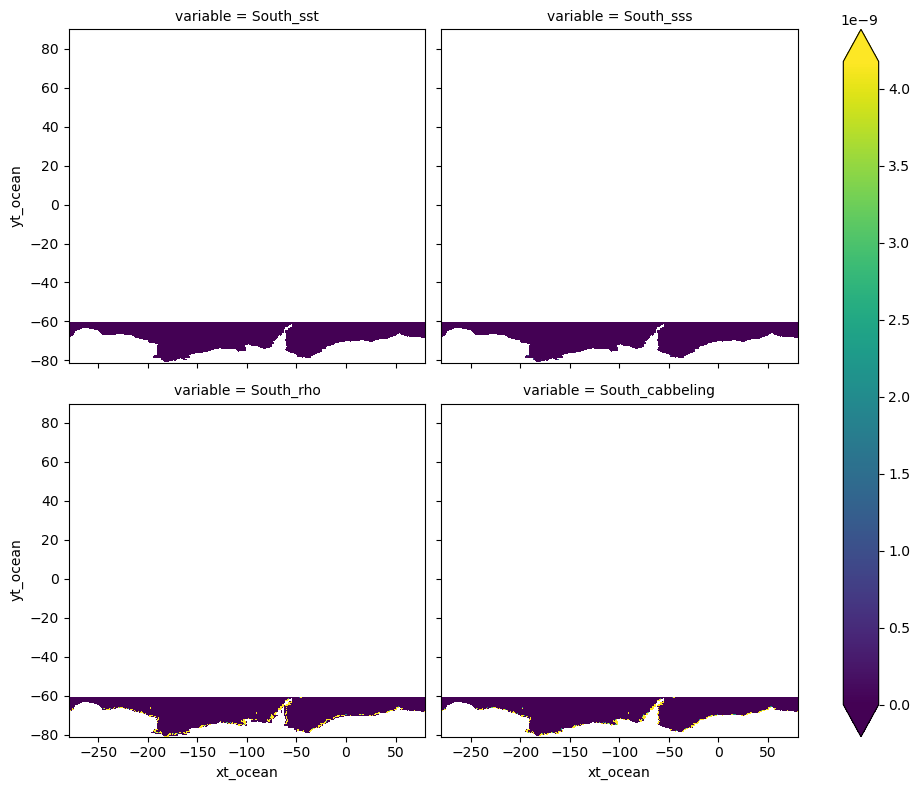

In [24]:
(south_ocean.isel(time=0)**2).coarsen(xt_ocean=10, yt_ocean=10).mean().to_array().plot(col='variable', 
                                                                         col_wrap=2, robust=True, 
                                                                         figsize=(10, 8));

# Make histogram of each term

In [30]:
np.unique(mask)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 12., nan])

In [24]:
rmask = mask
#mask_bins = np.arange(rmask.min()-0.5, rmask.max()+0.5)
mask_bins = np.array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5, 12.5, 99.5])
rho = tendencies.rho
delta_rho = 0.1
rho_bins = np.arange(1015, 1045, delta_rho)

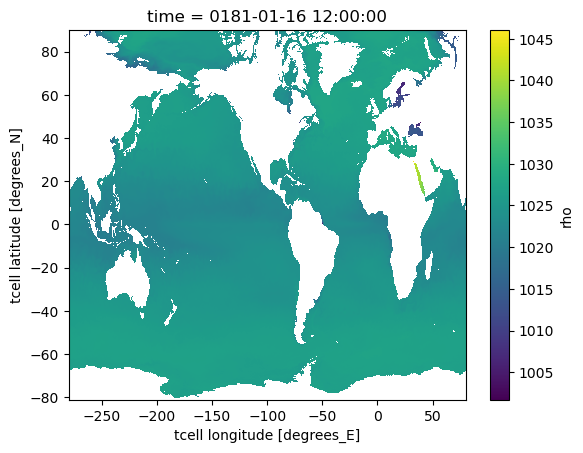

In [42]:
tendencies.rho[0].plot()

In [28]:
avg_mld = ds.mld.mean('time').compute()
weights = coord.area_t*avg_mld

In [60]:
from xhistogram.xarray import histogram
def histogram_function(ds, prefix, ocean, variable):
    """Generalized xhistogram's histogram function 
    for mixing tendency terms"""
    hist = histogram(rho.rename('rho0'), bins=[rho_bins],
                     weights=(ds[prefix+variable]*(avg_mld*coord.area_t).where(mask==ocean)),
                     dim=['xt_ocean', 'yt_ocean'])
    return hist / delta_rho

<xarray.Dataset>
Dimensions:    (time: 240, xt_ocean: 3600, yt_ocean: 2700)
Coordinates:
  * time       (time) object 0181-01-16 12:00:00 ... 0200-12-16 12:00:00
  * xt_ocean   (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean   (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
Data variables:
    sst        (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    sss        (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    rho_lap    (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    cabbeling  (time, yt_ocean, xt_ocean) float64 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>

In [43]:
avg_mld

<xarray.DataArray 'mld' (yt_ocean: 2700, xt_ocean: 3600)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    geolat_t  (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan nan
    geolon_t  (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan nan
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98

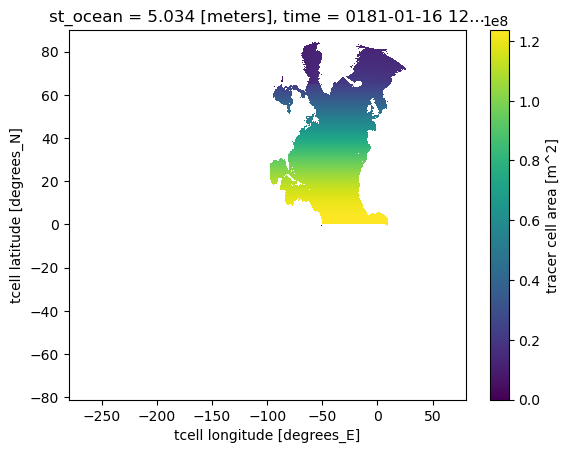

In [51]:
coord.area_t.where(mask==north_atlantic_ocean).plot()

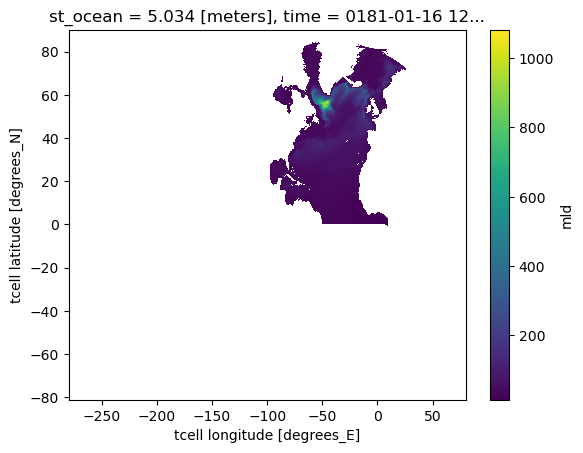

In [69]:
avg_mld.where(mask==north_atlantic_ocean).plot()

In [35]:
from xhistogram.xarray import histogram
def histogram_func(variable):
    """Generalized xhistogram's histogram function 
    for mixing tendency terms"""
    hist = histogram(rho.rename('rho0'), bins=[rho_bins],
                     weights=(variable*(coord.area_t*avg_mld).where(mask==north_atlantic_ocean).fillna(0.)), 
                              dim=['xt_ocean', 'yt_ocean'])
    return hist / delta_rho

In [98]:
from xhistogram.xarray import histogram
def histogram_func(variable):
    """Generalized xhistogram's histogram function 
    for mixing tendency terms"""
    hist = histogram(ds_merged.rho_load.rename('rho0'), bins=[rho_bins],
                     weights=(variable.fillna(0.)*(coord.area_t*avg_mld).where(mask==north_atlantic_ocean).fillna(0.)), 
                              dim=['xt_ocean', 'yt_ocean'])
    return hist / delta_rho

In [45]:
natl_load = natl_ocean.isel(time=10).load()

In [47]:
rho_load = rho.isel(time=10).load()

In [64]:
ds_merged = natl_load.merge(rho_load.rename('rho_load'))

In [65]:
ds_merged

<xarray.Dataset>
Dimensions:         (xt_ocean: 3600, yt_ocean: 2700)
Coordinates:
    time            object 0181-11-16 00:00:00
  * xt_ocean        (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.85 79.95
  * yt_ocean        (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.94 89.98
    lat             (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan
    lon             (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan
    st_ocean        float64 5.034
Data variables:
    NATL_sst        (yt_ocean, xt_ocean) float64 nan nan nan nan ... nan nan nan
    NATL_sss        (yt_ocean, xt_ocean) float64 nan nan nan nan ... nan nan nan
    NATL_rho_lap    (yt_ocean, xt_ocean) float64 nan nan nan nan ... nan nan nan
    NATL_cabbeling  (yt_ocean, xt_ocean) float64 nan nan nan nan ... nan nan nan
    rho_load        (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan

In [67]:
natl_list = list(ds_merged)

In [68]:
natl_list

['NATL_sst', 'NATL_sss', 'NATL_rho_lap', 'NATL_cabbeling', 'rho_load']

In [49]:
natl_drop = natl_load.drop(['lat', 'lon', 'st_ocean'])

In [99]:
test = xr.merge([histogram_func(ds_merged[var]).rename('OMEGA_' + var)
                      for var in natl_list])

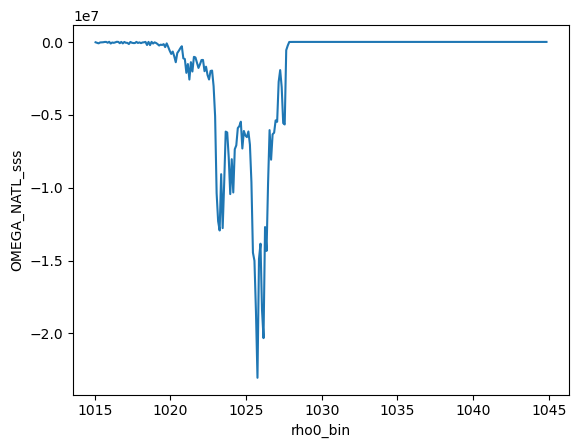

In [100]:
test.OMEGA_NATL_sss.plot()

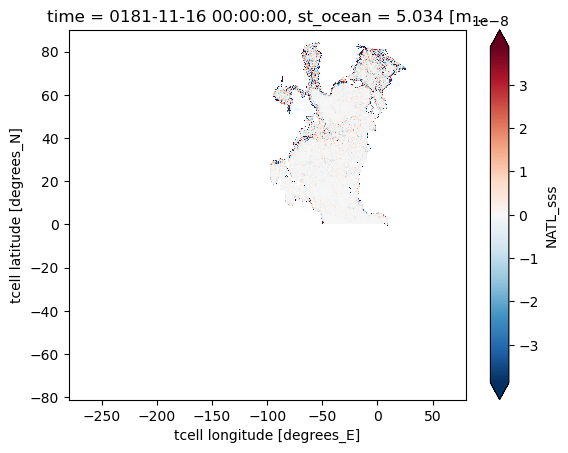

In [77]:
ds_merged.NATL_sss.plot(robust=True)

In [55]:
test_rho = histogram_func(rho_load)

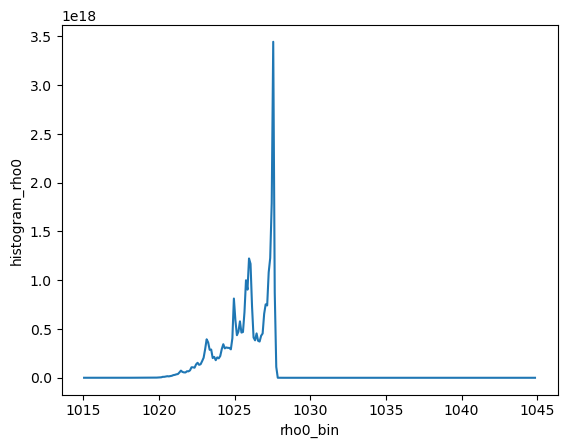

In [57]:
test_rho.plot()

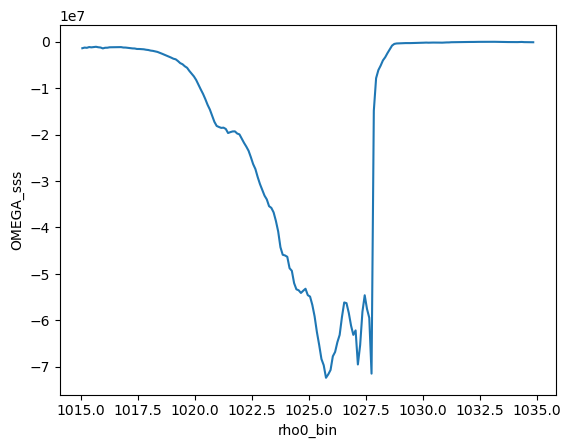

In [59]:
#test.OMEGA_sss.mean('time').plot()

In [61]:
natl_hist = xr.merge([histogram_function(natl_ocean, 'NATL_', north_atlantic_ocean,
                                         var).rename('OMEGA_' + var) for var in all_tendencies])
satl_hist = xr.merge([histogram_function(satl_ocean, 'SATL_', south_atlantic_ocean,
                                         var).rename('OMEGA_' + var) for var in all_tendencies])
npac_hist = xr.merge([histogram_function(npac_ocean, 'NPAC_', north_pacific_ocean,
                                         var).rename('OMEGA_' + var) for var in all_tendencies])
spac_hist = xr.merge([histogram_function(spac_ocean, 'SPAC_', south_pacific_ocean,
                                         var).rename('OMEGA_' + var) for var in all_tendencies])
ind_hist = xr.merge([histogram_function(ind_ocean, 'IND_', indian_ocean,
                                        var).rename('OMEGA_' + var) for var in all_tendencies])
arc_hist = xr.merge([histogram_function(arc_ocean, 'ARC_', arctic_ocean,
                                        var).rename('OMEGA_' + var) for var in all_tendencies])
south_hist = xr.merge([histogram_function(south_ocean, 'South_', southern_ocean,
                                          var).rename('OMEGA_' + var) for var in all_tendencies])

### More efficient way of computing histogram (below) with rho and mask bins, but not sure what is done under the hood when the bins are shifted to the right. Plot of NATL sss is diff btwn this way and the above way where the ds are split by basin before running histogram

## Find most frequently occuring isopycnal

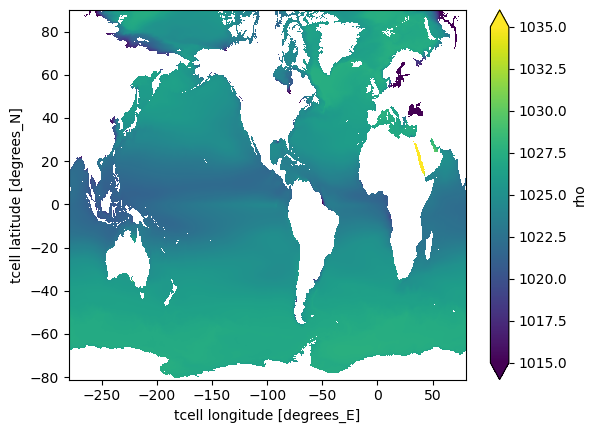

In [34]:
tendencies.rho.mean('time').plot(vmin=1015, vmax=1035);

In [24]:
from xhistogram.xarray import histogram
pdf_rho = histogram(rho, bins=[rho_bins], dim=['xt_ocean', 'yt_ocean'], density=True)

In [27]:
pdf_rho

<xarray.DataArray 'histogram_rho' (time: 240, rho_bin: 199)>
dask.array<truediv, shape=(240, 199), dtype=float64, chunksize=(1, 199), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0181-01-16 12:00:00 ... 0200-12-16 12:00:00
  * rho_bin  (rho_bin) float64 1.015e+03 1.015e+03 ... 1.035e+03 1.035e+03

In [25]:
mean_pdf_rho = pdf_rho.mean('time')

In [38]:
mean_pdf_rho

<xarray.DataArray 'histogram_rho' (rho_bin: 199)>
dask.array<mean_agg-aggregate, shape=(199,), dtype=float64, chunksize=(199,), chunktype=numpy.ndarray>
Coordinates:
  * rho_bin  (rho_bin) float64 1.015e+03 1.015e+03 ... 1.035e+03 1.035e+03

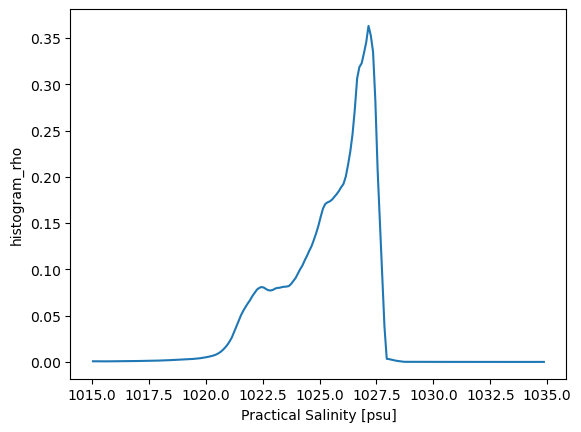

In [39]:
mean_pdf_rho.plot()

In [40]:
mean_pdf_rho.argmax().values

array(121)

In [41]:
mean_pdf_rho[121].rho_bin

<xarray.DataArray 'rho_bin' ()>
array(1027.15)
Coordinates:
    rho_bin  float64 1.027e+03
Attributes:
    cell_methods:   time: mean
    long_name:      Practical Salinity
    standard_name:  sea_water_salinity
    time_avg_info:  average_T1,average_T2,average_DT
    units:          psu
    valid_range:    [-10.0, 100.0]

In [42]:
rho_bins[121] #1027.1 is the most frequently occurring density 

1027.1000000000026

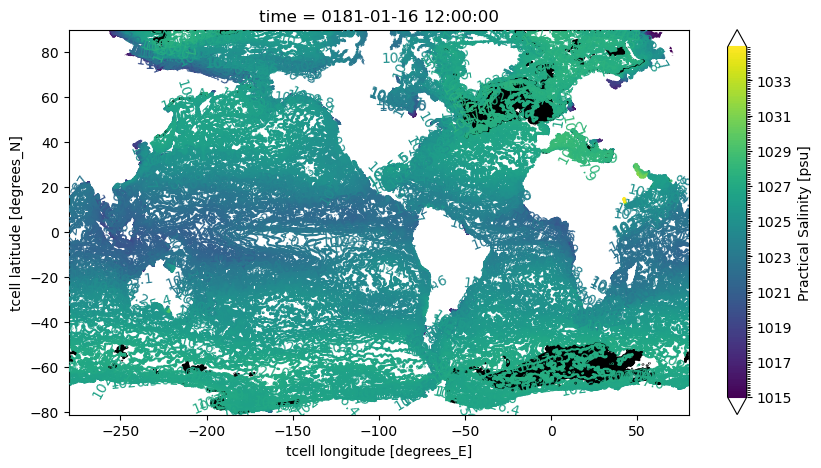

In [43]:
fig, ax = plt.subplots(figsize=(10,5))
C = rho[0].plot.contour(levels=rho_bins, ax=ax, add_colorbar=True)
C.collections[121].set_color('k')
C.collections[121].set_linewidth(1.5)
plt.clabel(C);

# 2) Save histograms <a class='anchor' id='second-bullet'> </a>

In [35]:
client.restart()

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.aca20d682b9f49d0ad60ba953a5bd910/status,


In [84]:
import dask, distributed
dask.config.get('distributed.scheduler.worker-saturation')

1.1

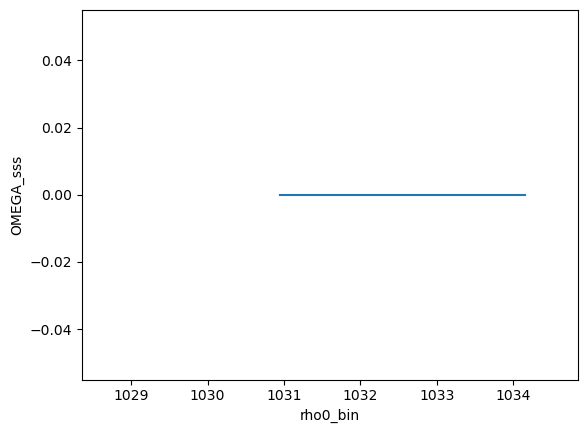

In [62]:
natl_hist.OMEGA_sss.mean('time').plot()

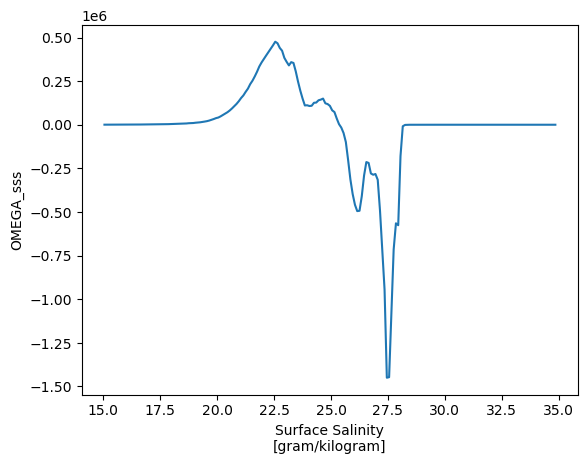

In [53]:
#OLD FIG FROM POP DATA
natl.OMEGA_sss.mean('time').plot()

# FIGS Start

In [71]:
def ann_mean2(ds):
    fig = plt.figure(figsize=(12,5))
    line_colors=['green', 'orange', 
                 'k', 'blue']#, 'purple', 'yellow'] #order of sst, sss, rho, cab, surf heat, surf salt
    for (i,j) in zip(list(ds.data_vars), line_colors):
        (ds[i].mean('time')/1e6).plot(label=f'{i}', color=j)
    plt.legend()
    plt.ylabel(r'Transformation (Sv)', fontsize=16)
    plt.grid()
    plt.ylim(-1,1)
    plt.title('Annual Mean Transformation Terms', fontsize=20);

In [38]:
client.restart()

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.aca20d682b9f49d0ad60ba953a5bd910/status,


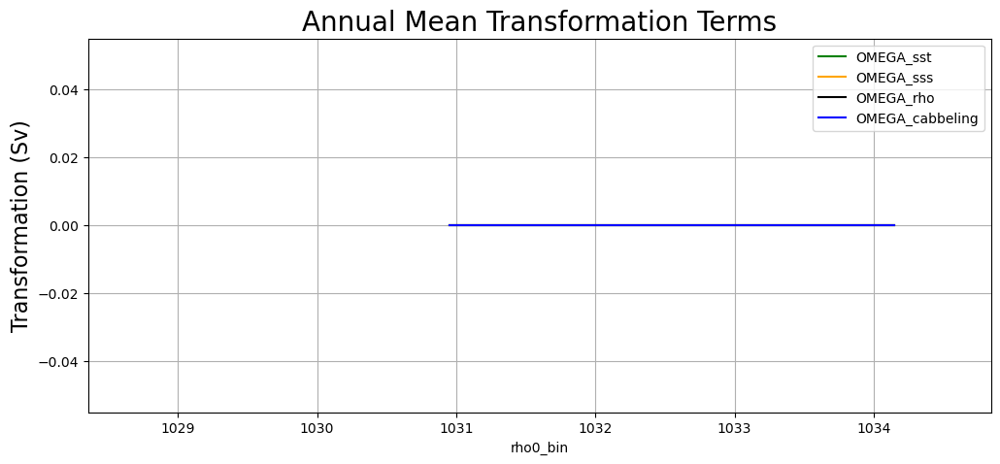

In [48]:
ann_mean2(natl_hist)

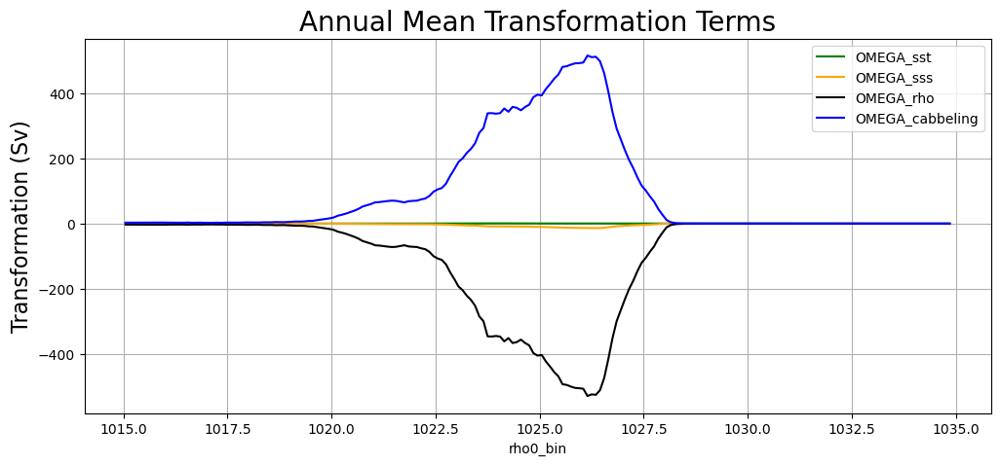

In [39]:
ann_mean2(natl_hist)

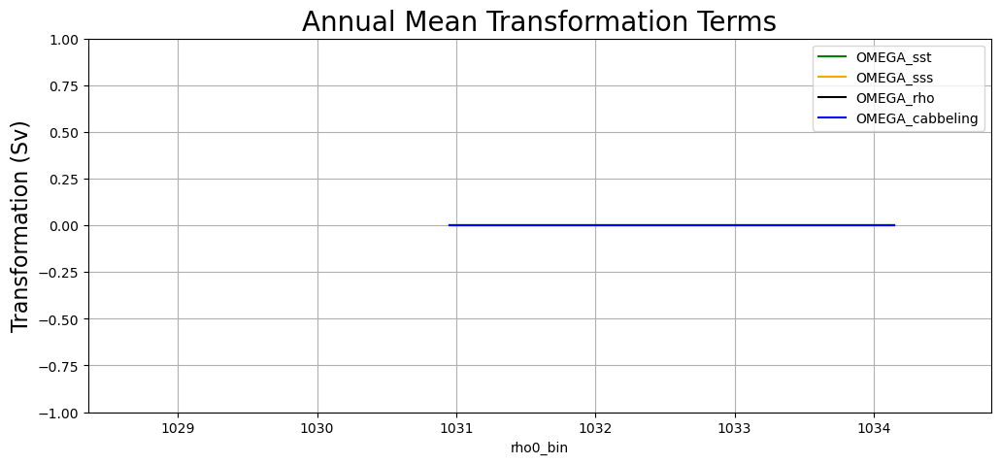

In [72]:
#satl
ann_mean2(satl_hist)

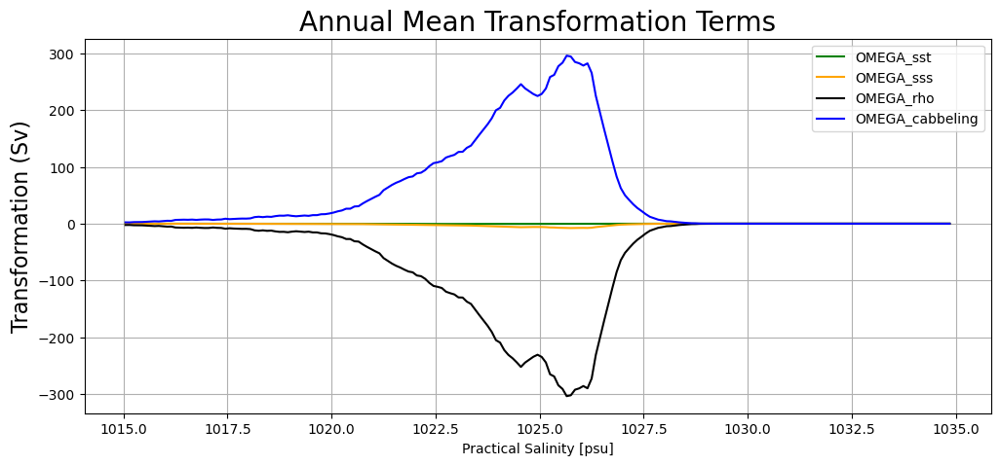

In [60]:
ann_mean2(npac_hist)

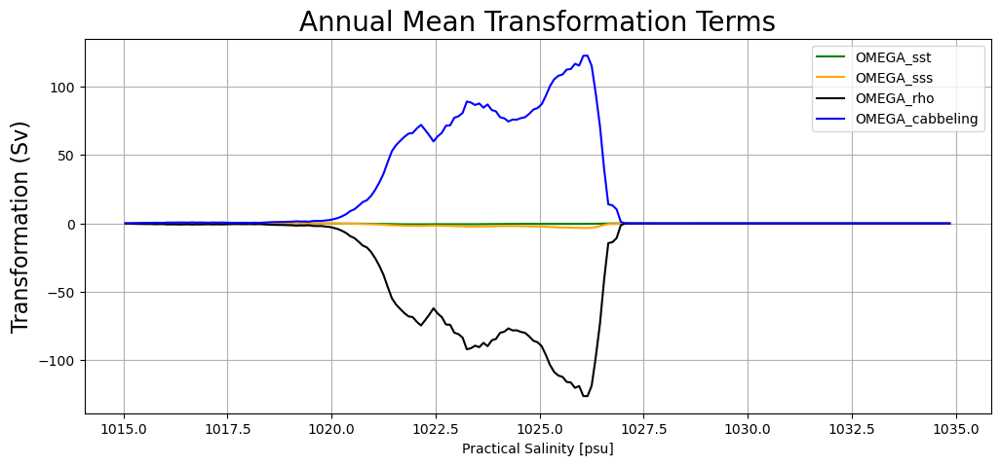

In [61]:
ann_mean2(spac_hist)

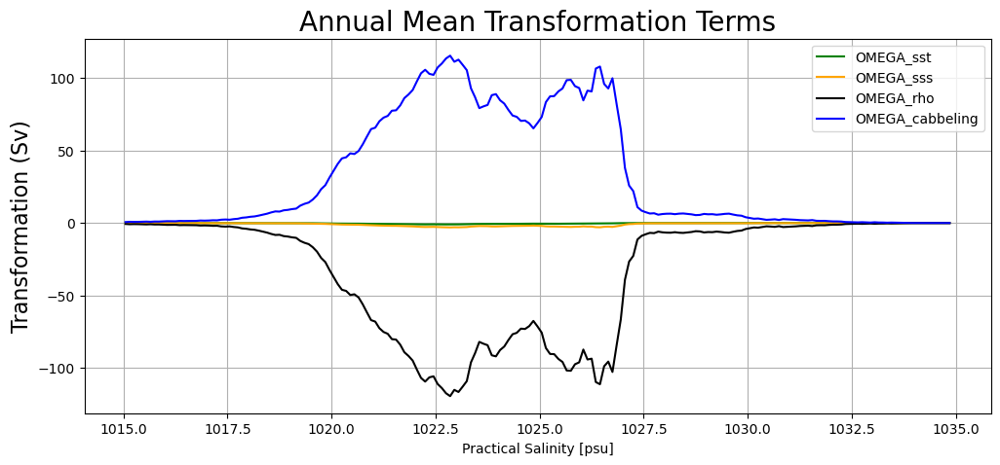

In [62]:
ann_mean2(ind_hist)

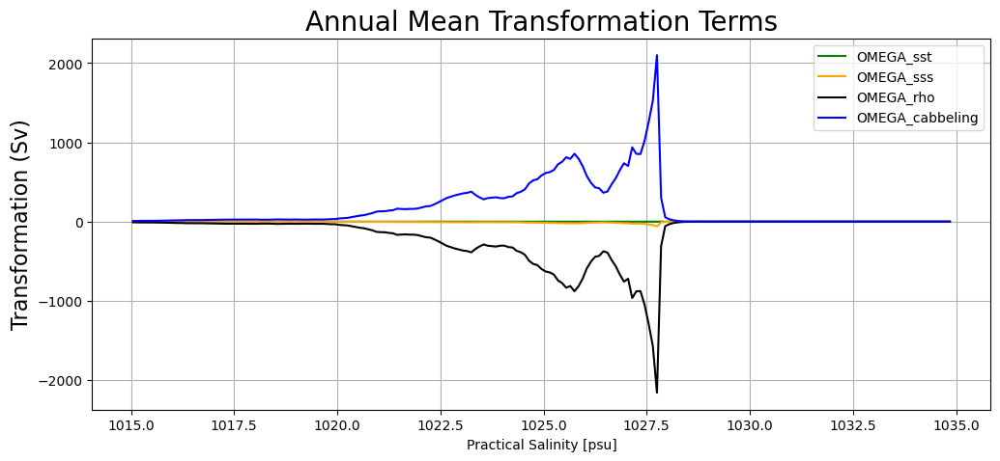

In [63]:
ann_mean2(arc_hist)

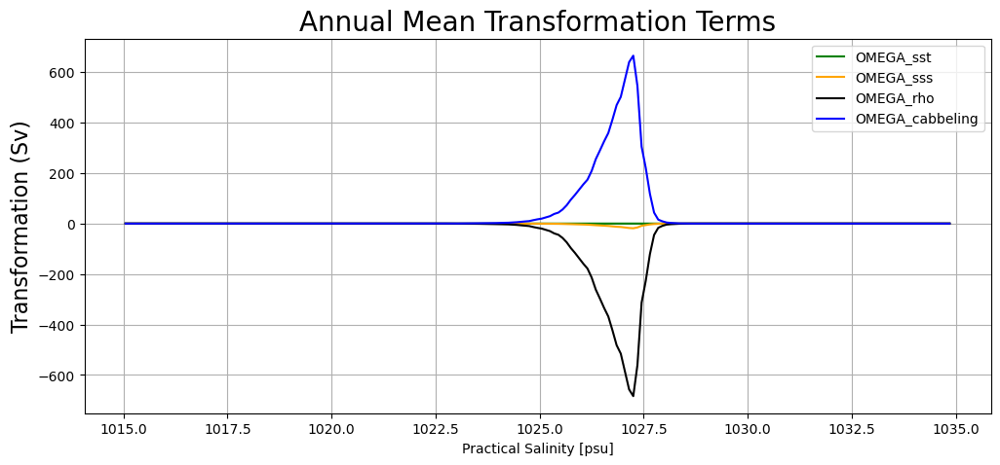

In [64]:
ann_mean2(south_hist)

# FiGS end

In [30]:
#saving north atlantic basin histograms
gcsmap_hist_natl = gcfs_w_token.get_mapper('pangeo-tmp/stb2145/CESM/datasets/basin-histograms/avg-mld/natl_histograms.zarr')
natl_histograms.to_zarr(gcsmap_hist_natl, mode='w')

KilledWorker: Attempted to run task ('where-getitem-getitem-1ee7a8e7487f6025964d78e3f51e6230', 7879, 0, 0) on 3 different workers, but all those workers died while running it. The last worker that attempt to run the task was tls://10.2.46.3:44827. Inspecting worker logs is often a good next step to diagnose what went wrong. For more information see https://distributed.dask.org/en/stable/killed.html.

In [31]:
client.restart()

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.61f6427177d842889fac636418d0a205/status,


In [ ]:
#saving north pacific basin histograms
gcsmap_hist_npac = gcfs_w_token.get_mapper('pangeo-tmp/stb2145/CESM/datasets/basin-histograms/avg-mld/npac_histograms.zarr')
npac_histograms.to_zarr(gcsmap_hist_npac, mode='w')

Task exception was never retrieved
future: <Task finished name='Task-15905' coro=<Client._gather.<locals>.wait() done, defined at /srv/conda/envs/notebook/lib/python3.10/site-packages/distributed/client.py:2119> exception=AllExit()>
Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.10/site-packages/distributed/client.py", line 2128, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-15906' coro=<Client._gather.<locals>.wait() done, defined at /srv/conda/envs/notebook/lib/python3.10/site-packages/distributed/client.py:2119> exception=AllExit()>
Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.10/site-packages/distributed/client.py", line 2128, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-15907' coro=<Client._gather.<locals>.wait() done, defined at /srv/conda/envs/notebook/lib/p

In [45]:
cluster.close()
client.close()

[Back to top](#top)